In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk import bigrams
from collections import Counter

In [2]:
tips_data = pd.read_pickle('tips_data.pkl')
all_data = pd.read_pickle('all_data.pkl')
lyft_data = pd.read_pickle('lyft_data.pkl')

In [3]:
""" This function uses the word cloud package to create a word cloud plot which helps in visualizing """

def word_cloud_plot(text, title = "Word Cloud", mask = None):
    try:
        word_cloud = WordCloud(width=1600, height=800, max_font_size=200, mask = mask).generate(text)
    except:
        word_cloud = WordCloud(width=1600, height=800, max_font_size=200, mask = mask).fit_words(text)
        
    plt.figure(figsize=(20,15))
    plt.title(title, size = 25)
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()   

In [4]:
"""This function takes in any text blob, tokenizes the blob and then extracts the bigrams from the same. 
It also gives back the Bigram count dictionary"""

def string_bigram_frequency(text_blob):
    
    tokens = word_tokenize(text_blob) #from the NLTK package
    bi_grams = []
    for txt in list(bigrams(tokens)): #bigrams is also from the NLTK package
        bi_grams.append((' '.join([word + ' ' for word in txt])).strip())
    
    all_tokens = bi_grams  + tokens
    count_dict = Counter(all_tokens) #counter is from the collections package
    
    return count_dict

In [5]:
def precent_calculation(category):
    neg_count = 0
    pos_count = 0
    for cat in category:
        if cat == 1:
            pos_count+=1
        elif cat == -1:
            neg_count+=1
    try:
        return (round((pos_count/(neg_count+pos_count))*100,2))    
    except:
        return 0

In [6]:
year_month_tips = tips_data.groupby('concat_month', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_month':'year_month', 'polarity':'mean_polarity'})

In [7]:
year_month_all = all_data.groupby('concat_month', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_month':'year_month', 'polarity':'mean_polarity'})

In [8]:
year_month_lyft = lyft_data.groupby('concat_month', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_month':'year_month', 'polarity':'mean_polarity'})

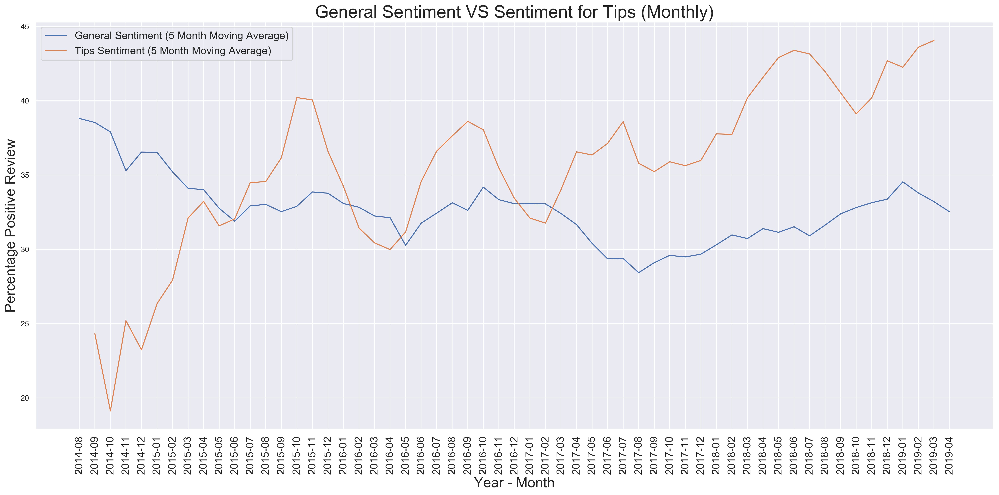

In [226]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.lineplot(x = year_month_all.year_month, y = year_month_all.average_sentiment.rolling(window=5).mean())
sns.lineplot(x = year_month_tips.year_month, y = year_month_tips.average_sentiment.rolling(window=5).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['General Sentiment (5 Month Moving Average)', 'Tips Sentiment (5 Month Moving Average)'], fontsize = 15)
plt.title('General Sentiment VS Sentiment for Tips (Monthly)', fontsize = 25)
plt.tight_layout()
plt.savefig('general_vs_tip_sentiment_month.png')

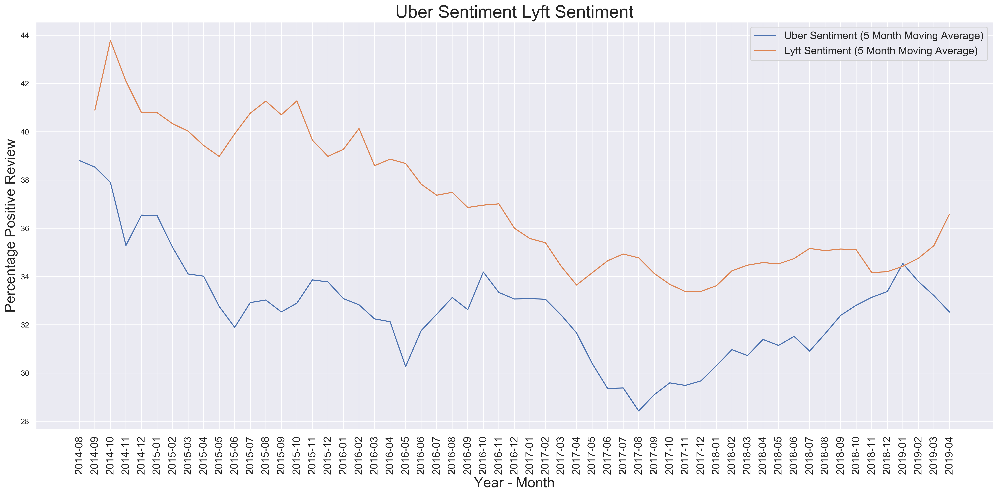

In [10]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.lineplot(x = year_month_all.year_month, y = year_month_all.average_sentiment.rolling(window=5).mean())
sns.lineplot(x = year_month_lyft.year_month, y = year_month_lyft.average_sentiment.rolling(window=5).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['Uber Sentiment (5 Month Moving Average)', 'Lyft Sentiment (5 Month Moving Average)'], fontsize = 15)
plt.title('Uber Sentiment Lyft Sentiment', fontsize = 25)
plt.tight_layout()
plt.savefig('uber_vs_lyft_sentiment_month.png')

In [13]:
tips_data['concat_quarter'] = tips_data.year.map(str)+'-'+tips_data.quarter.map(str)
all_data['concat_quarter'] = all_data.year.map(str)+'-'+all_data.quarter.map(str)

In [14]:
year_quarter_tips = tips_data.groupby('concat_quarter', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_quarter':'year_quarter', 'polarity':'mean_polarity'})

In [15]:
year_quarter_all = all_data.groupby('concat_quarter', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_quarter':'year_quarter', 'polarity':'mean_polarity'})

In [16]:
year_quarter_lyft = lyft_data.groupby('concat_quarter', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_quarter':'year_quarter', 'polarity':'mean_polarity'})

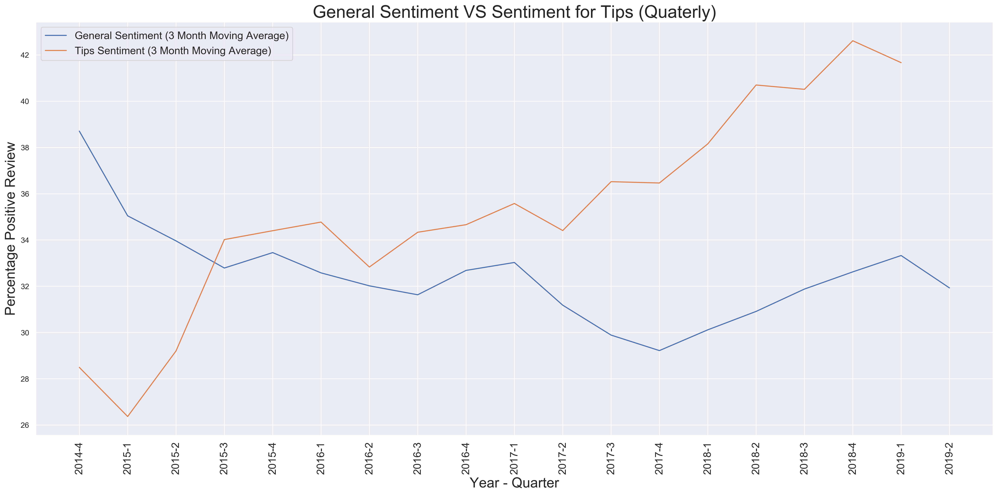

In [227]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.lineplot(x = year_quarter_all.year_quarter, y = year_quarter_all.average_sentiment.rolling(window=3).mean())
sns.lineplot(x = year_quarter_tips.year_quarter, y = year_quarter_tips.average_sentiment.rolling(window=3).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Quarter', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['General Sentiment (3 Month Moving Average)', 'Tips Sentiment (3 Month Moving Average)'], fontsize = 15)
plt.title('General Sentiment VS Sentiment for Tips (Quaterly)', fontsize = 25)
plt.tight_layout()
plt.savefig('general_vs_tip_sentiment_quarter.png')

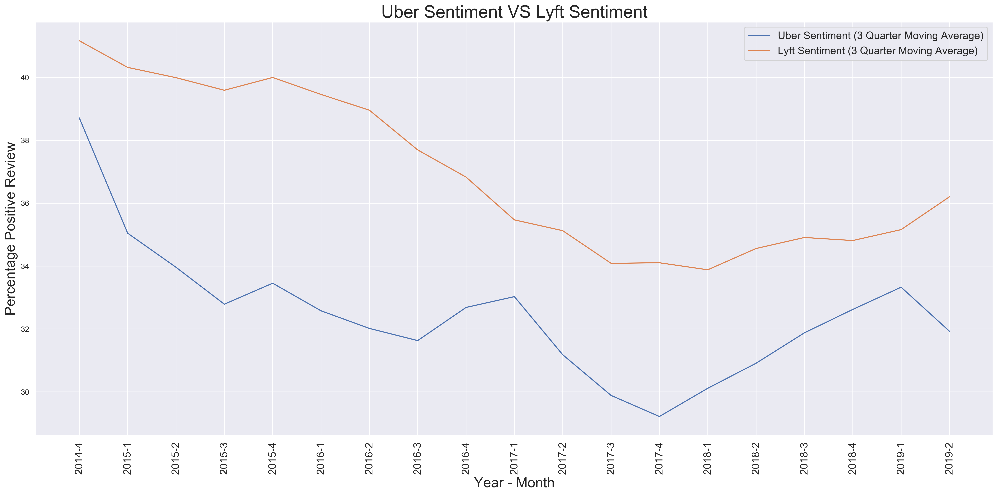

In [18]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.lineplot(x = year_quarter_all.year_quarter, y = year_quarter_all.average_sentiment.rolling(window=3).mean())
sns.lineplot(x = year_quarter_lyft.year_quarter, y = year_quarter_lyft.average_sentiment.rolling(window=3).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['Uber Sentiment (3 Quarter Moving Average)', 'Lyft Sentiment (3 Quarter Moving Average)'], fontsize = 15)
plt.title('Uber Sentiment VS Lyft Sentiment', fontsize = 25)
plt.tight_layout()
plt.savefig('uber_vs_lyft_sentiment_quarter.png')

In [21]:
tips_semi_month_sentiment = pd.DataFrame(tips_data.pred_cat.resample('SMS').apply(precent_calculation))
all_semi_month_sentiment = pd.DataFrame(all_data.pred_cat.resample('SMS').apply(precent_calculation))

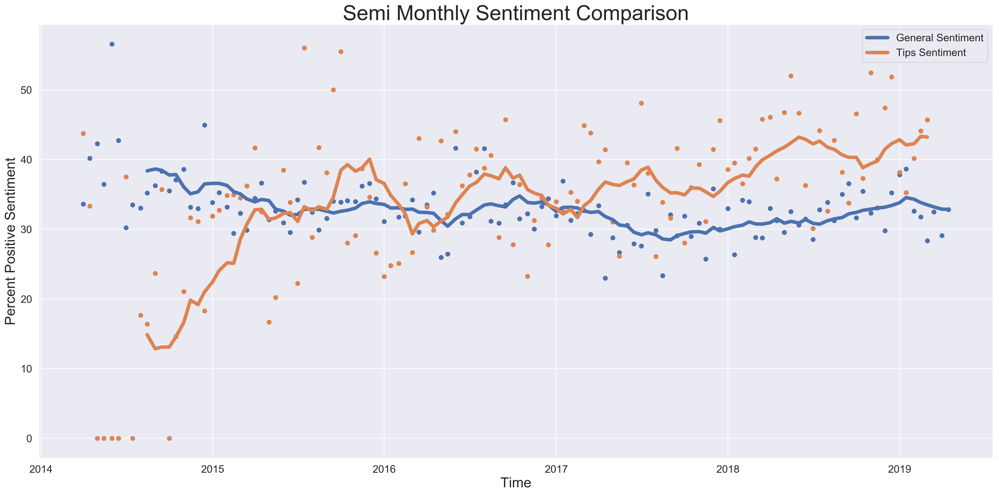

In [22]:
plt.figure(figsize=(20,10), dpi = 300)
plt.title('Semi Monthly Sentiment Comparison', fontsize = 30)
plt.scatter(x = all_semi_month_sentiment.index, y = all_semi_month_sentiment.pred_cat)
plt.plot(all_semi_month_sentiment.pred_cat.rolling(window = 10).mean(), linewidth = 5)
plt.scatter(x = tips_semi_month_sentiment.index, y = tips_semi_month_sentiment.pred_cat)
plt.plot(tips_semi_month_sentiment.pred_cat.rolling(window = 10).mean(), linewidth = 5)
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Percent Positive Sentiment', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.legend(['General Sentiment', 'Tips Sentiment'], fontsize = 15)
plt.tight_layout()
plt.savefig('semi_monthly_sentiment_comparison.png')

In [23]:
aug_sep_2017 = tips_data[(tips_data.concat_month == '2017-08') | (tips_data.concat_month == '2017-09')]

In [24]:
from gensim.models import TfidfModel
from gensim.corpora import Dictionary

In [25]:
def tfidf_weights(tokenized_list):
    dictionary = Dictionary(tokenized_list)
    vectors = [dictionary.doc2bow(text) for text in tokenized_list]
    tfidf = TfidfModel(vectors)
    weights = tfidf[vectors[0]]
    weights = [(dictionary[pair[0]], pair[1]) for pair in weights]
    return dict(weights)

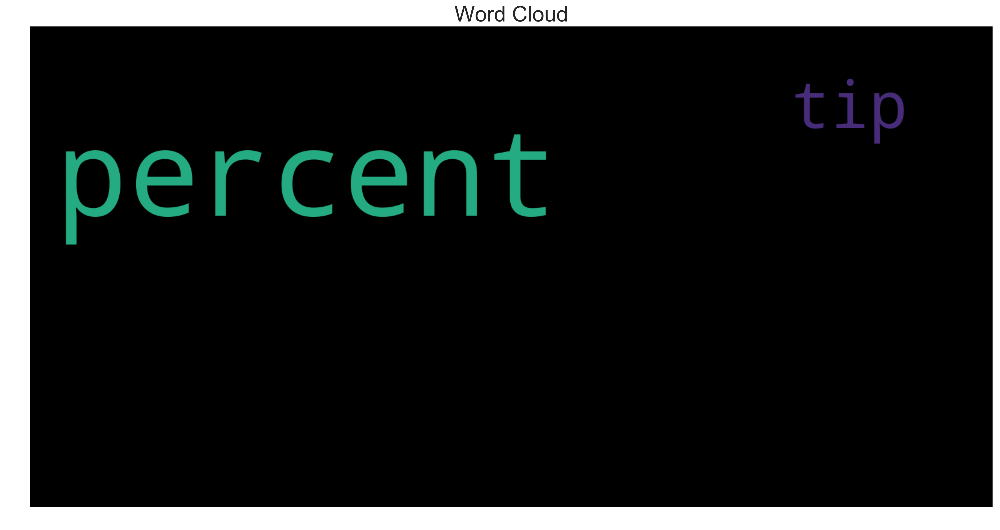

In [26]:
word_cloud_plot(tfidf_weights(aug_sep_2017.cleaned_message.values))

In [50]:
oct_2016_april_2017 = tips_data[tips_data.concat_month.isin(['2016-12', '2017-01', '2017-02'])]

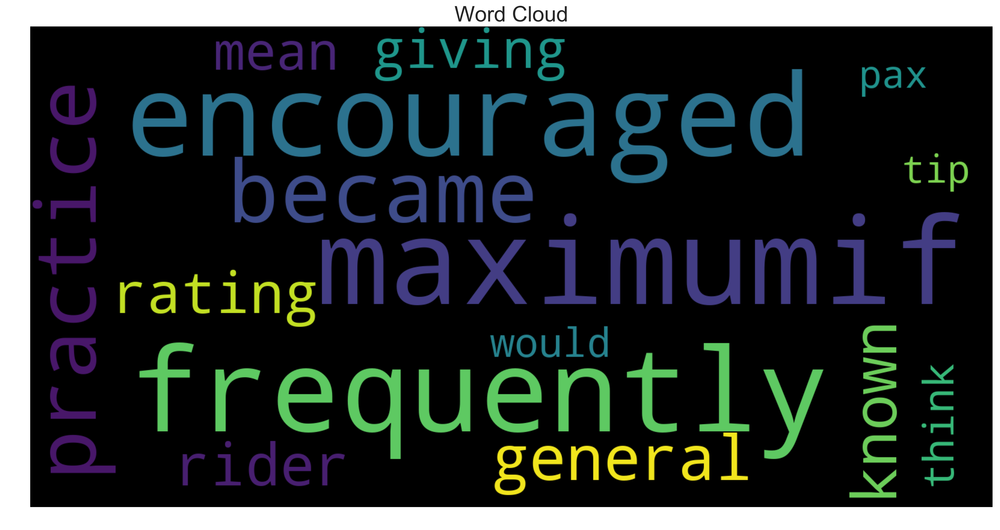

In [51]:
word_cloud_plot(tfidf_weights(oct_2016_april_2017.cleaned_message.values))

In [52]:
[' '.join(text) for text in oct_2016_april_2017.cleaned_message if 'encouraged' in text]

['think giving rating rider tip tip mean rating maximumif became general practice known rider would pax encouraged tip frequently',
 'maven saidwhat think giving rating rider tip tip mean rating maximumif became general practice known rider would pax encouraged tip frequentlyclick expandagain nothing promise nothing vegasr saidbut driver know fense accepting ride better infoclick expanda sensible ideal doenst play real worldoveruber saidwordi rate everyone tip long arent unseemly fashion rate driver rate five even though dont mint water time aux cord always help luggage large item going luggage areasome provide little extra consider service beyond dont thats going change rate nonproviders click expandreally get beyond badge even told way give star could always tip better driver like incentive stay platform thats good riderno way give star exchange happened real ing life',
 'think giving rating rider tip tip mean rating maximumif became general practice known rider would pax encouraged 

In [48]:
dec_2015_july_2016 = tips_data[tips_data.concat_month.isin(['2016-02', '2016-03', '2016-04', '2016-05'])]

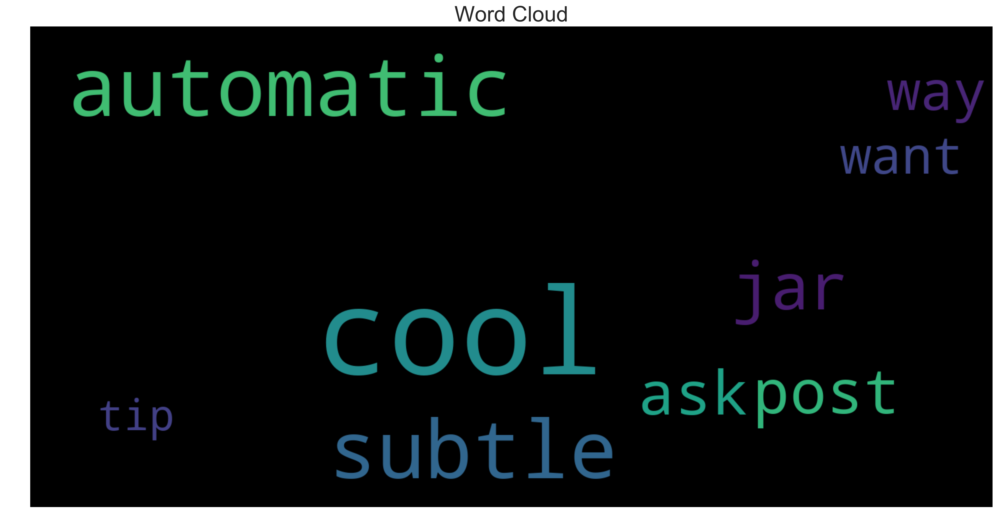

In [49]:
word_cloud_plot(tfidf_weights(dec_2015_july_2016.cleaned_message.values))

In [53]:
aug_sep_2015 = tips_data[tips_data.concat_month.isin(['2015-08', '2015-09'])]

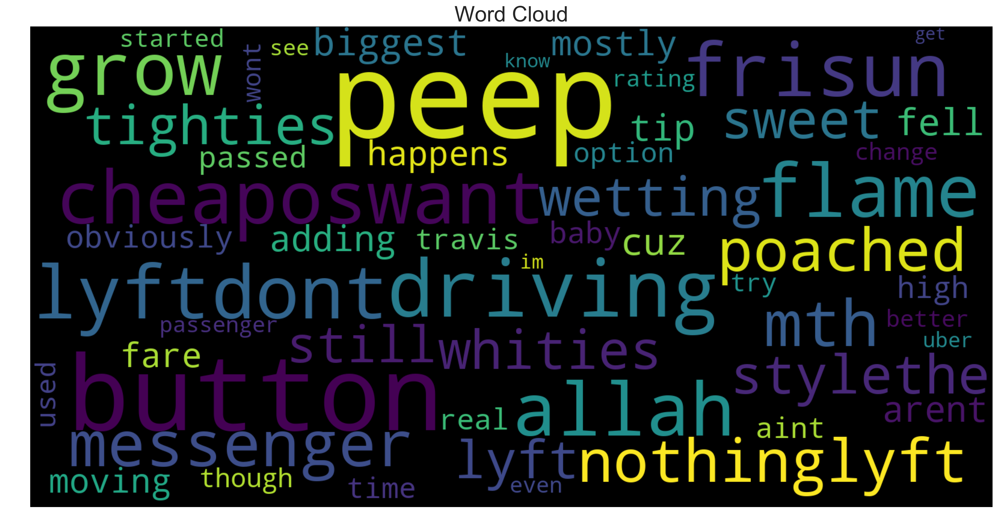

In [54]:
word_cloud_plot(tfidf_weights(aug_sep_2015.cleaned_message.values))

In [70]:
import statsmodels.api as sm

In [180]:
before_tip = year_month_tips[year_month_tips.year_month <= '2017-06']
after_tip = year_month_tips[year_month_tips.year_month >= '2017-06']

In [181]:
model = sm.OLS( before_tip.average_sentiment, sm.add_constant(before_tip.index.values.astype(float)))
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:      average_sentiment   R-squared:                       0.143
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     6.014
Date:                Wed, 17 Apr 2019   Prob (F-statistic):             0.0192
Time:                        22:27:51   Log-Likelihood:                -133.72
No. Observations:                  38   AIC:                             271.4
Df Residuals:                      36   BIC:                             274.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         26.9893      2.669     10.112      0.0

In [182]:
results.params

const    26.989271
x1        0.304335
dtype: float64

In [183]:
model = sm.OLS( after_tip.average_sentiment, sm.add_constant(after_tip.index.values.astype(float)))
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:      average_sentiment   R-squared:                       0.205
Model:                            OLS   Adj. R-squared:                  0.166
Method:                 Least Squares   F-statistic:                     5.168
Date:                Wed, 17 Apr 2019   Prob (F-statistic):             0.0342
Time:                        22:27:51   Log-Likelihood:                -64.554
No. Observations:                  22   AIC:                             133.1
Df Residuals:                      20   BIC:                             135.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.1097      7.687      3.007      0.0

In [184]:
results.params

const    23.109718
x1        0.364647
dtype: float64

In [185]:
def before_tip_pred(x):
    y = 0.304335*x + 26.989271
    return y

In [186]:
def after_tip_pred(x):
    y = 0.364647*x + 23.109718
    return y

In [187]:
before_tip['x'] = before_tip.index
after_tip['x'] = after_tip.index
before_tip['pred_y'] = before_tip.x.apply(lambda x: before_tip_pred(x))
after_tip['pred_y'] = after_tip.x.apply(lambda x: after_tip_pred(x))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.

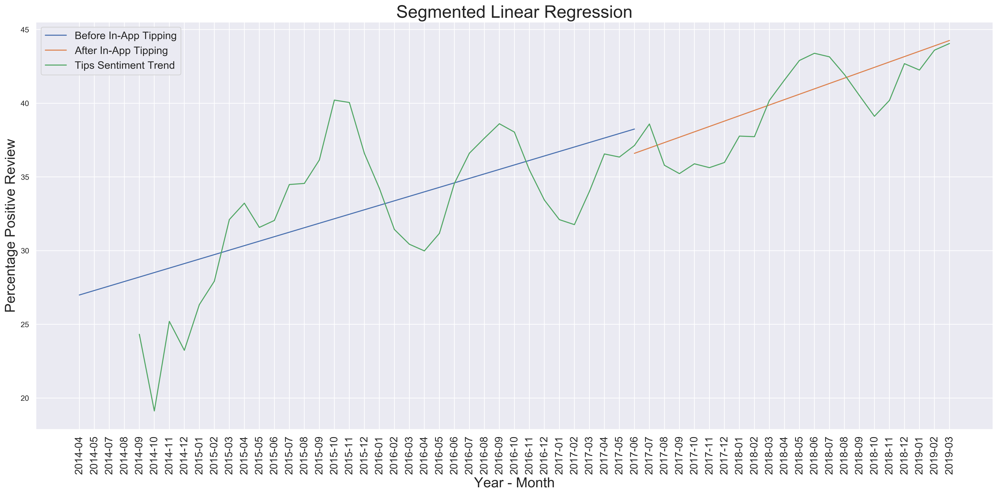

In [188]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
#sns.lineplot(x = year_month_all.year_month, y = year_month_all.average_sentiment.rolling(window=5).mean())
sns.lineplot(x = before_tip.year_month, y = before_tip.pred_y)
sns.lineplot(x = after_tip.year_month, y = after_tip.pred_y)
sns.lineplot(x = year_month_tips.year_month, y = year_month_tips.average_sentiment.rolling(window=5).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['Before In-App Tipping', 'After In-App Tipping', 'Tips Sentiment Trend'], fontsize = 15)
plt.title('Segmented Linear Regression', fontsize = 25)
plt.tight_layout()
plt.savefig('segmented_regression.png')

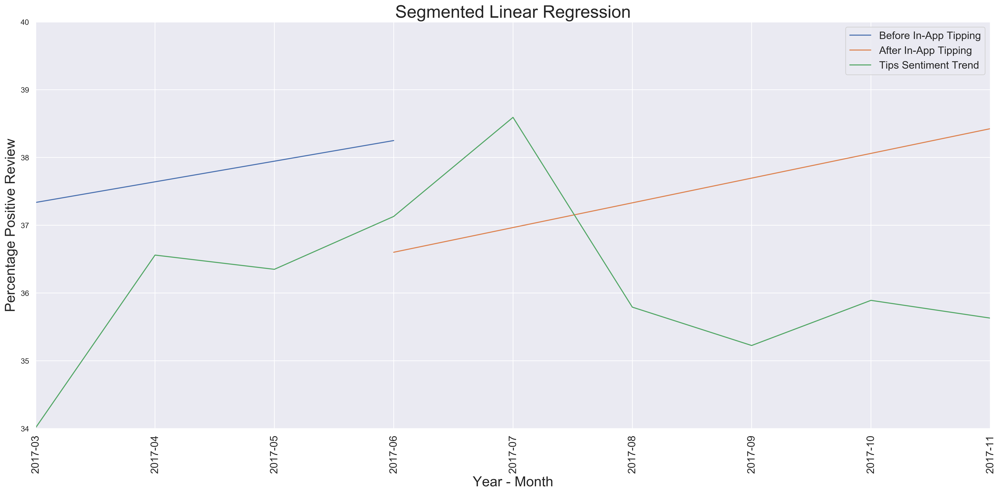

In [194]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
#sns.lineplot(x = year_month_all.year_month, y = year_month_all.average_sentiment.rolling(window=5).mean())
sns.lineplot(x = before_tip.year_month, y = before_tip.pred_y)
sns.lineplot(x = after_tip.year_month, y = after_tip.pred_y)
sns.lineplot(x = year_month_tips.year_month, y = year_month_tips.average_sentiment.rolling(window=5).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['Before In-App Tipping', 'After In-App Tipping', 'Tips Sentiment Trend'], fontsize = 15)
plt.title('Segmented Linear Regression', fontsize = 25)
plt.tight_layout()
plt.xlim('2017-03','2017-11')
plt.ylim(34,40)
plt.savefig('segmented_regression_zoomed.png')

In [210]:
year_month_tips['ceo_steps_down'] = [0]*38 +[1]*21
year_month_tips['in_app_tipping'] = [0]*38 +[1]*21
year_month_tips['uber_eats'] = [0]*20 +[1]*39
year_month_tips['class_action_suit'] = [0]*25 +[1]*34

In [214]:
year_month_tips['ind'] = year_month_tips.index+1

In [215]:
year_month_tips.head()

,year_month,average_sentiment,mean_polarity,ceo_steps_down,in_app_tipping,uber_eats,class_action_suit,ind
0,2014-04,40.43,0.085945,0,0,0,0,1
1,2014-05,0.00,0.000000,0,0,0,0,2
2,2014-07,37.50,0.009249,0,0,0,0,3
3,2014-08,16.76,0.070159,0,0,0,0,4
4,2014-09,26.92,0.089807,0,0,0,0,5


In [216]:
causal_model = sm.OLS( year_month_tips.average_sentiment,
                      year_month_tips[['ceo_steps_down', 'in_app_tipping', 'uber_eats', 'class_action_suit', 'ind']])
causal_results = causal_model.fit()
print(causal_results.summary())

                            OLS Regression Results                            
Dep. Variable:      average_sentiment   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.886
Method:                 Least Squares   F-statistic:                     115.8
Date:                Thu, 18 Apr 2019   Prob (F-statistic):           4.17e-26
Time:                        00:53:38   Log-Likelihood:                -229.77
No. Observations:                  59   AIC:                             467.5
Df Residuals:                      55   BIC:                             475.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
ceo_steps_down      -13.9036      2.75

In [217]:
causal_results.params

ceo_steps_down      -13.903617
in_app_tipping      -13.903617
uber_eats           -12.761280
class_action_suit   -12.432334
ind                   1.909969
dtype: float64

In [231]:
tips_data.groupby('user')['message'].count()[tips_data.groupby('user')['message'].count() > 200]

user
Cableguynoe               370
DRider85                  238
Fuzzyelvis                205
There’s no need to tip    240
Uberfunitis               881
steveK2016                461
tohunt4me                 263
upyouruber                411
Name: message, dtype: int64

In [233]:
all_data[all_data.user == 'Uberfunitis']

(324, 13)

In [234]:
lyft_data[lyft_data.user == 'Uberfunitis']

(44, 13)

In [235]:
data1 = tips_data[tips_data.user == 'Uberfunitis']
data2 = all_data[all_data.user == 'Uberfunitis']
data3 = lyft_data[lyft_data.user == 'Uberfunitis']

In [236]:
data1_group = data1.groupby('concat_month', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_month':'year_month', 'polarity':'mean_polarity'})

In [237]:
data2_group = data2.groupby('concat_month', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_month':'year_month', 'polarity':'mean_polarity'})

In [238]:
data3_group = data3.groupby('concat_month', as_index=False).agg({'pred_cat':precent_calculation,'polarity':'mean'}).rename(
    columns={'pred_cat':'average_sentiment', 'concat_month':'year_month', 'polarity':'mean_polarity'})

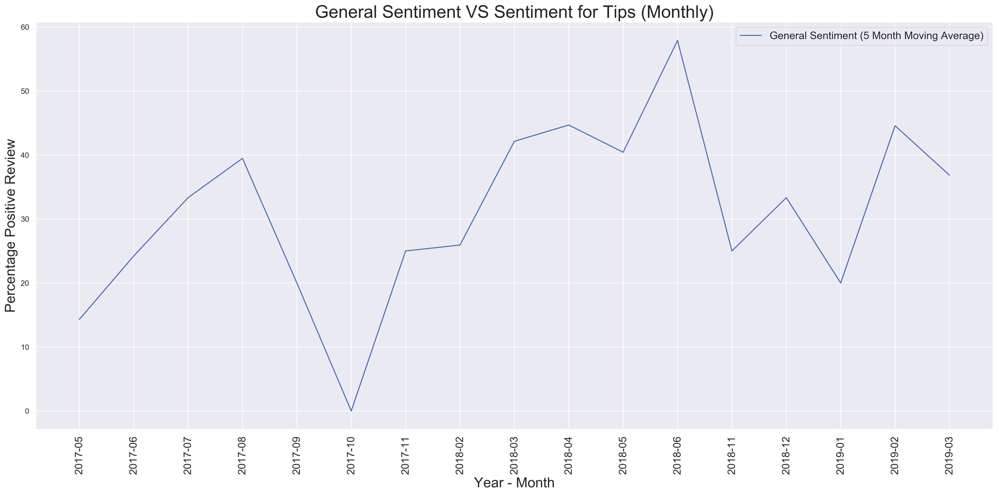

In [241]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.lineplot(x = data1_group.year_month, y = data1_group.average_sentiment)
#sns.lineplot(x = data2_group.year_month, y = data2_group.average_sentiment)
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['General Sentiment (5 Month Moving Average)', 'Tips Sentiment (5 Month Moving Average)'], fontsize = 15)
plt.title('General Sentiment VS Sentiment for Tips (Monthly)', fontsize = 25)
plt.tight_layout()

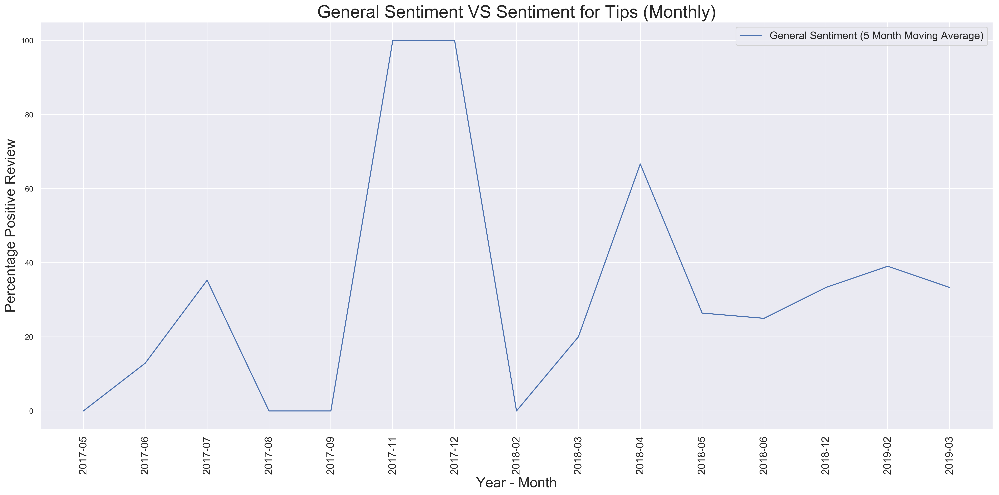

In [245]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.lineplot(x = data2_group.year_month, y = data2_group.average_sentiment)
#sns.lineplot(x = data1_group.year_month, y = data1_group.average_sentiment)
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['General Sentiment (5 Month Moving Average)', 'Tips Sentiment (5 Month Moving Average)'], fontsize = 15)
plt.title('General Sentiment VS Sentiment for Tips (Monthly)', fontsize = 25)
plt.tight_layout()

In [247]:
data1_group

,year_month,average_sentiment,mean_polarity
0,2017-05,14.29,0.071618
1,2017-06,24.21,0.036877
2,2017-07,33.33,0.153038
3,2017-08,39.47,0.037425
4,2017-09,20.00,0.239167
5,2017-10,0.00,-0.047917
6,2017-11,25.00,0.107765
7,2018-02,25.93,0.072919
8,2018-03,42.14,0.133244
9,2018-04,44.68,0.106235


In [248]:
data2_group

,year_month,average_sentiment,mean_polarity
0,2017-05,0.00,0.018803
1,2017-06,12.90,0.120565
2,2017-07,35.29,0.125140
3,2017-08,0.00,0.002315
4,2017-09,0.00,-0.203125
5,2017-11,100.00,0.106667
6,2017-12,100.00,-0.007483
7,2018-02,0.00,0.262500
8,2018-03,20.00,0.073835
9,2018-04,66.67,0.347835


In [252]:
merge = data1_group.merge(data2_group, left_on = data1_group.year_month, right_on = data2_group.year_month)

In [253]:
merge.head()

,key_0,year_month_x,average_sentiment_x,mean_polarity_x,year_month_y,average_sentiment_y,mean_polarity_y
0,2017-05,2017-05,14.29,0.071618,2017-05,0.00,0.018803
1,2017-06,2017-06,24.21,0.036877,2017-06,12.90,0.120565
2,2017-07,2017-07,33.33,0.153038,2017-07,35.29,0.125140
3,2017-08,2017-08,39.47,0.037425,2017-08,0.00,0.002315
4,2017-09,2017-09,20.00,0.239167,2017-09,0.00,-0.203125


In [270]:
merge.index.values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13],
      dtype=int64)

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


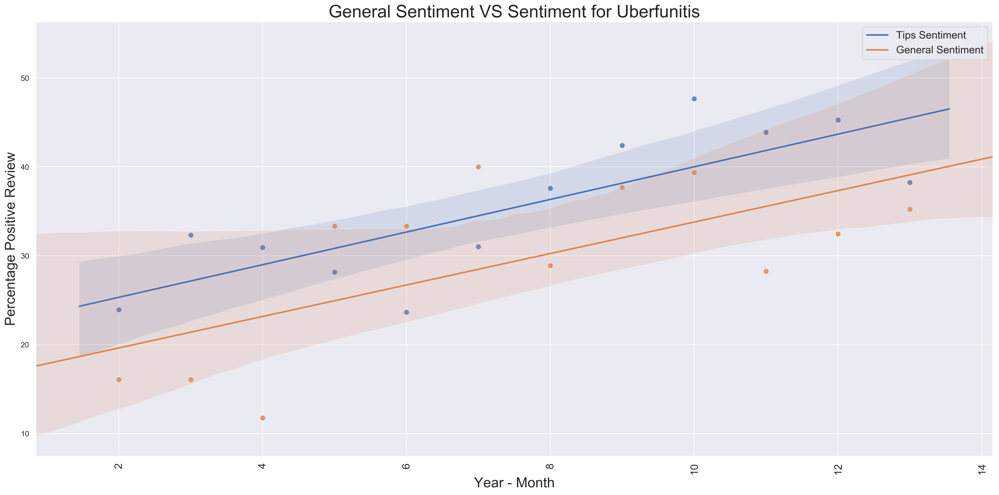

In [278]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.regplot(x = merge.index.values, y = merge.average_sentiment_x.rolling(window=3).mean())
sns.regplot(x = merge.index.values, y = merge.average_sentiment_y.rolling(window=3).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['Tips Sentiment', 'General Sentiment'], fontsize = 15)
plt.title('General Sentiment VS Sentiment for Uberfunitis', fontsize = 25)
plt.tight_layout()

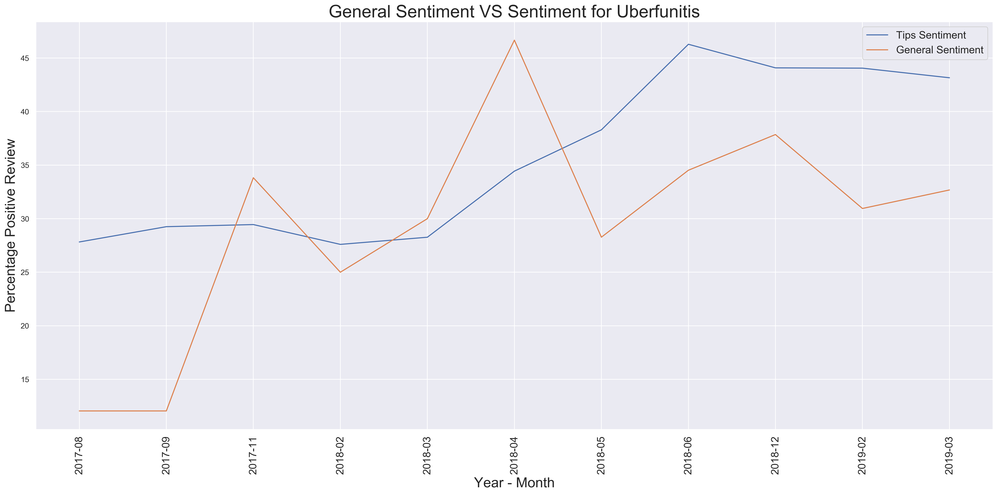

In [282]:
sns.set(style="darkgrid", rc = {'figure.figsize':(20,10),'figure.dpi':300})
sns.lineplot(x = merge.year_month_x, y = merge.average_sentiment_x.rolling(window=4).mean())
sns.lineplot(x = merge.year_month_x, y = merge.average_sentiment_y.rolling(window=4).mean())
plt.xticks(rotation = 90, fontsize = 15)
plt.xlabel('Year - Month', fontsize = 20)
plt.ylabel('Percentage Positive Review', fontsize = 20)
plt.legend(['Tips Sentiment', 'General Sentiment'], fontsize = 15)
plt.title('General Sentiment VS Sentiment for Uberfunitis', fontsize = 25)
plt.tight_layout()

In [262]:
results1.params

const    23.109718
x1        0.364647
dtype: float64

In [263]:
model2 = sm.OLS( merge.average_sentiment_y, sm.add_constant(merge.index.values.astype(float)))
results2 = model.fit()
print(results2.summary())

                            OLS Regression Results                            
Dep. Variable:      average_sentiment   R-squared:                       0.205
Model:                            OLS   Adj. R-squared:                  0.166
Method:                 Least Squares   F-statistic:                     5.168
Date:                Thu, 18 Apr 2019   Prob (F-statistic):             0.0342
Time:                        13:13:37   Log-Likelihood:                -64.554
No. Observations:                  22   AIC:                             133.1
Df Residuals:                      20   BIC:                             135.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.1097      7.687      3.007      0.0

In [264]:
results2.params

const    23.109718
x1        0.364647
dtype: float64

In [185]:
def tips(x):
    y = 0.304335*x + 26.989271
    return y

In [186]:
def general(x):
    y = 0.364647*x + 23.109718
    return y